In [23]:
from io import BytesIO
import os
import pickle
from collections import defaultdict

import numpy as np


def load_embeddings(fast_path_dir, seg_embeddings_dir):
    print('Running get embeddings call')
    if fast_path_dir and os.path.exists(fast_path_dir):
        with open(fast_path_dir, 'rb') as f:
            embed_dict = pickle.load(f)

        print('Fast path')
        embeddings = embed_dict['average_embeddings']
        segment_ids_across_images = embed_dict['segment_ids']
        return embeddings, segment_ids_across_images

    print('No fast path sir')
    average_embeddings_across_images = []
    segment_ids_across_images = [] 
    # img_idx = []
    imgs = sorted(os.listdir(seg_embeddings_dir))
    img_to_vec_list = {}
    vector_idx = 0
    vec_to_img = [] # Maps vector index to image index

    print(len(imgs))

    for idx, seg_emb in enumerate(imgs):
        seg_emb_file = os.path.join(seg_embeddings_dir, seg_emb)

        try:
            with open(seg_emb_file, "rb") as f:
                dictionary = pickle.load(f)
        except:
            print('Error loading embeddings', seg_emb)
            continue
    
        dictionary["average_embeddings"] = np.load(BytesIO(dictionary["average_embeddings"]))['a']
        average_embeddings = dictionary["average_embeddings"]
        segment_ids = dictionary["segment_ids"]
        if len(segment_ids) == 0:
            print('what')
            continue

        if segment_ids[0] == 0:
            average_embeddings = average_embeddings[1:]
            segment_ids = segment_ids[1:]

        if len(average_embeddings) == 0:
            continue

        # Have a dictionary of image names pointing to the start and end index of the embeddings
        img_name = seg_emb.split('.pkl')[0]
        start_idx = vector_idx
        # end_idx = start_idx + len(average_embeddings) - 1
        end_idx = start_idx + len(average_embeddings)

        segment_id_idx = len(segment_ids_across_images)
        img_to_vec_list[img_name] = (start_idx, end_idx, segment_id_idx)
        for i in range(start_idx, end_idx):
            # vec_to_img.append(idx)
            vec_to_img.append(img_name)

        average_embeddings_across_images.append(average_embeddings)
        segment_ids_across_images.append(segment_ids)

        vector_idx += len(average_embeddings)
        # img_idx.append(idx)


    average_embeddings_across_images = np.vstack(average_embeddings_across_images)
    
    return average_embeddings_across_images, segment_ids_across_images, img_to_vec_list, vec_to_img

def create_new_pickle(seg_embed_dir, pickle_out_path='coco-2014-val-clip-embeds-fast-2.pkl'):
    if os.path.exists(pickle_out_path):
        print('fast pickle exists loading...')
        with open(pickle_out_path, 'rb') as f:
            embed_dict = pickle.load(f)

        return embed_dict

    embeds, seg_ids, img_to_vec_list, vec_to_img = load_embeddings(None, seg_embed_dir)
    out_dict = {
        'average_embeddings': embeds, 
        'segment_ids': seg_ids, 
        'img_to_vec_list': img_to_vec_list,
        'vec_to_img': vec_to_img,
    }
    with open(pickle_out_path, "wb") as f:
        pickle.dump(out_dict, f)

    return out_dict

img_dir = '/data/users/jie/data-slicing/COCO/train2017/'
seg_dir = '/data/users/jie/data-slicing/COCO/sam/train2017_vit_l/'
embed_dir = '/data/users/jie/data-slicing/COCO/embeds/train2017_fixed_clip_only'
new_pickle_path = 'train_2017_fixed_clip_only.pkl'

# BDD100K
# img_dir = '/data/users/jie/data-slicing/bdd100k/images/100k/train/'
# seg_dir = '/data/users/jie/data-slicing/bdd100k/sam/vit_l/'
# embed_dir = '/data/users/jie/data-slicing/bdd100k/embeds/sam_maskclip/'
# new_pickle_path = 'bdd100k_sam_maskclip.pkl'

# img_dir = '/data/users/jie/data-slicing/LVIS/train2017'
# seg_dir = '/data/users/jie/data-slicing/LVIS/segmentation'
# embed_dir = '/data/users/jie/data-slicing/LVIS/embeds/train2017_maskclip/'
# new_pickle_path = 'lvis_train2017_maskclip.pkl'
embed_dict = create_new_pickle(embed_dir, new_pickle_path)

fast pickle exists loading...


Number of images:  118287


  0%|          | 0/118287 [00:00<?, ?it/s]

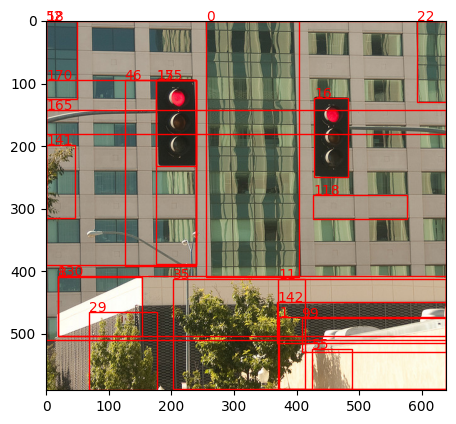

  0%|          | 1/118287 [00:01<43:01:08,  1.31s/it]

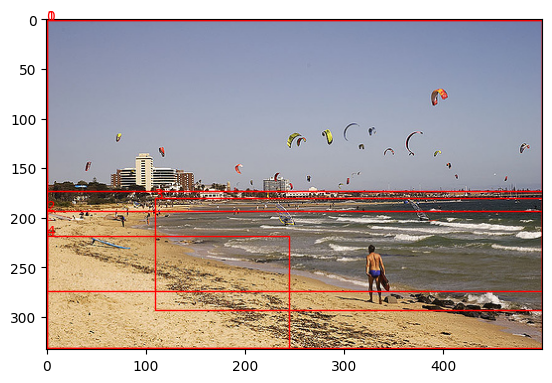

  0%|          | 2/118287 [00:01<20:14:52,  1.62it/s]

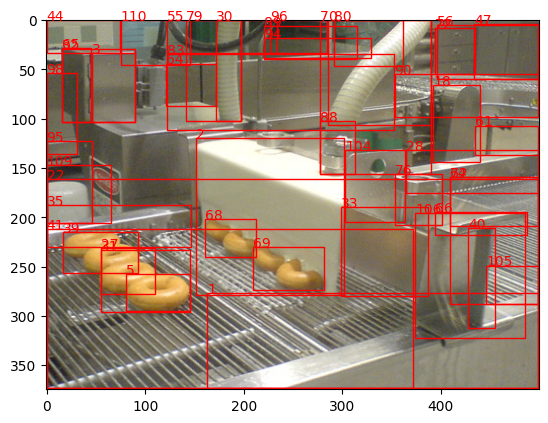

  0%|          | 3/118287 [00:01<14:07:39,  2.33it/s]

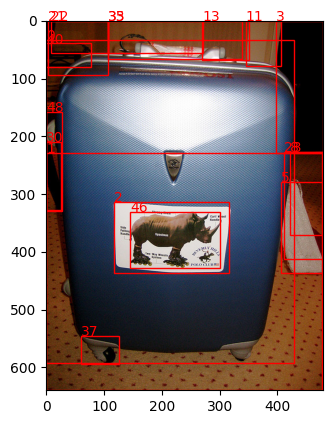

  0%|          | 4/118287 [00:01<10:16:48,  3.20it/s]

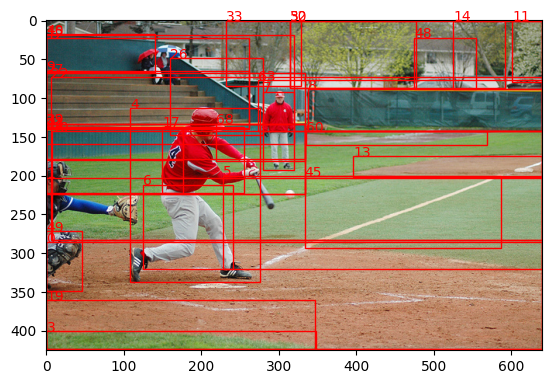

  0%|          | 4/118287 [00:01<16:08:48,  2.03it/s]


In [24]:
import random
from tqdm import tqdm
import json

import pycocotools

random.seed(43)

average_embeddings = embed_dict['average_embeddings']
img_to_vec_list = embed_dict['img_to_vec_list']
vec_to_img = embed_dict['vec_to_img']
img_to_vec = embed_dict['img_to_vec_list']
seg_ids = embed_dict['segment_ids']
embeds = average_embeddings

# n_imgs = 40_000
n_imgs = len(img_to_vec)
print("Number of images: ", n_imgs)
imgs = sorted(img_to_vec.keys())
idxs = random.sample(range(len(imgs)), n_imgs)

chosen_imgs = [(i, imgs[i]) for i in idxs]
data = [(i, img, img_to_vec[img]) for (i, img) in chosen_imgs]

def extract_segments(json_file):
    with open(json_file, 'r') as f:
        json_dict = json.load(f)
    segments = [seg['segmentation'] for seg in json_dict]
    decoded_segments = []
    for seg in segments:
        decoded_segments.append(pycocotools.mask.decode(seg))

    return decoded_segments

def load_masks(seg_path: str):
    with open(seg_path, 'r') as f:
        sam_output = json.load(f)
    
    masks = []
    for segment in sam_output:
        rle = segment['segmentation']
        mask = pycocotools.mask.decode(rle)
        masks.append(mask)
    
    return masks

def get_box(mask):
    rows = np.any(mask > 0, axis=1)
    cols = np.any(mask > 0, axis=0)
    y_min, y_max = np.where(rows)[0][[0, -1]]
    x_min, x_max = np.where(cols)[0][[0, -1]]
    return x_min, y_min, x_max, y_max


counter = 0
size_threshold = 0.01

for (idx, img, vec_info) in tqdm(data):
    start, end, seg_id_idx = vec_info
    seg_id = seg_ids[seg_id_idx]
    seg_emb = embeds[start:end]

    # Fix off-by-one seg_id
    seg_id = [i - 1 for i in seg_id]
    seg_file = os.path.join(seg_dir, img + '.json')
    if not os.path.exists(seg_file):
        print('No segmentation file', seg_file)
        continue

    decoded_segments = load_masks(seg_file)
    id_segments = [(i, seg) for i, seg in enumerate(decoded_segments)]

    # # Ensure that all seg_ids are in the decoded segments
    all_seg_ids = [i for i, _ in id_segments]
    segment_difference = set(seg_id) - set(all_seg_ids)
    if len(segment_difference) > 0:
        print('This shouldnt happen...')

    boxes = []
    for box in decoded_segments:
        x_min, y_min, x_max, y_max = get_box(box)
        boxes.append((x_min, y_min, x_max, y_max))

    # Draw boxes
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from PIL import Image

    fig, ax = plt.subplots(1)
    ax.imshow(plt.imread(os.path.join(img_dir, img)))
    img_rgb = Image.open(os.path.join(img_dir, img)).convert('RGB')
    img_area = img_rgb.size[0] * img_rgb.size[1]
    for i, box in enumerate(boxes):
        x_min, y_min, x_max, y_max = box
        box_size = (x_max - x_min) * (y_max - y_min)
        if box_size < img_area * size_threshold:
            continue
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min, str(i), color='red')

    plt.show()
    counter += 1
    if counter == 5:
        break

In [25]:
import os
from PIL import Image
from tqdm.notebook import tqdm
import multiprocessing as mp
import numpy as np
from functools import partial
import imagesize

def process_chunk(chunk, seg_ids, embeds, img_dir, seg_dir, size_threshold):
    results = []
    for (idx, img, vec_info) in chunk:
        start, end, seg_id_idx = vec_info
        seg_id = seg_ids[seg_id_idx]
        seg_emb = embeds[start:end]

        # Fix off-by-one seg_id
        seg_id = [i - 1 for i in seg_id]
        seg_id_to_emb = {i: emb for i, emb in zip(seg_id, seg_emb)}
        seg_file = os.path.join(seg_dir, img + '.json')
        if not os.path.exists(seg_file):
            continue

        decoded_segments = load_masks(seg_file)
        id_segments = list(enumerate(decoded_segments))

        # img_rgb = Image.open(os.path.join(img_dir, img)).convert('RGB')
        img_width, img_height = imagesize.get(os.path.join(img_dir, img))
        
        # img_width, img_height = img_rgb.size
        img_area = img_width * img_height

        for i, (curr_seg_id, segment) in enumerate(id_segments):
            try:
                x_min, y_min, x_max, y_max = get_box(segment)
                box_area = (x_max - x_min) * (y_max - y_min)
                if box_area < img_area * size_threshold:
                    continue

                b_box = (x_min / img_width, y_min / img_height, x_max / img_width, y_max / img_height)
                # b_embed = seg_emb[i]
                b_embed = seg_id_to_emb[curr_seg_id]
                results.append((b_box, b_embed, curr_seg_id, img))
            except Exception as e:
                print('Error processing', img, i)
                print(e)

    return results

def get_box_embed_data_parallel(data, seg_ids, embeds, img_dir, seg_dir, size_threshold=0.005, num_processes=None):
    if num_processes is None:
        num_processes = mp.cpu_count()

    # Split the data into chunks
    chunk_size = len(data) // num_processes
    chunks = [data[i:i + chunk_size] for i in range(0, len(data), chunk_size)]

    # Create a pool of worker processes
    with mp.Pool(num_processes) as pool:
        # Create a partial function with fixed arguments
        process_chunk_partial = partial(
            process_chunk,
            seg_ids=seg_ids,
            embeds=embeds,
            img_dir=img_dir,
            seg_dir=seg_dir,
            size_threshold=size_threshold
        )

        # Use tqdm to show progress
        results = list(tqdm(pool.imap(process_chunk_partial, chunks), total=len(chunks), desc="Processing chunks"))

    # Flatten the results
    flattened_results = [item for sublist in results for item in sublist]

    # Separate the results into individual lists
    boxes, box_embeds, box_seg_ids, box_img = zip(*flattened_results)

    return list(boxes), list(box_embeds), list(box_seg_ids), list(box_img)

# Usage example (to be run in a Jupyter notebook cell):

box_pickle_name = new_pickle_path.split('.pkl')[0] + '_boxes.pkl'
boxes, box_embeds, box_seg_ids, box_img = None, None, None, None

if os.path.exists(box_pickle_name):
    print("Load from file")
    with open(box_pickle_name, 'rb') as f:
        box_data = pickle.load(f)

    boxes = box_data['boxes']
    box_embeds = box_data['embeds']
    box_seg_ids = box_data['seg_ids']
    box_img = box_data['img'] 
    # boxes, box_embeds, box_seg_ids, box_img = box_data
else:
    print("Load manual (long ):)")
    boxes, box_embeds, box_seg_ids, box_img = get_box_embed_data_parallel(
        data, seg_ids, embeds, img_dir, seg_dir, num_processes=32
    )

    box_dict = {
        'boxes': boxes,
        'embeds': box_embeds,
        'seg_ids': box_seg_ids,
        'img': box_img
    }

    if not os.path.exists(box_pickle_name):
        with open(box_pickle_name, 'wb') as f:
            pickle.dump(box_dict, f)

Load manual (long ):)


Processing chunks:   0%|          | 0/33 [00:11<?, ?it/s]

Error processing 000000187714.jpg 10
10


In [22]:
print(img_dir, seg_dir)

/data/users/jie/data-slicing/bdd100k/images/100k/train/ /data/users/jie/data-slicing/bdd100k/sam/vit_l/


In [5]:
print(len(boxes), len(box_embeds), len(box_seg_ids), len(box_img))

# Plot first 5 boxes
# import matplotlib.pyplot as plt
# import matplotlib.patches as patches
# from PIL import Image

# for i in range(3):
#     i = i + 299900
#     img_path = os.path.join(img_dir, box_img[i])
#     img_rgb = Image.open(img_path).convert('RGB')

#     x_min, y_min, x_max, y_max = boxes[i]
#     box_area = (x_max - x_min) * (y_max - y_min)
#     fig, ax = plt.subplots(1, figsize=(4,4))
#     ax.imshow(img_rgb)
#     rect = patches.Rectangle((x_min * img_rgb.size[0], y_min * img_rgb.size[1]), (x_max - x_min) * img_rgb.size[0], (y_max - y_min) * img_rgb.size[1], linewidth=1, edgecolor='r', facecolor='none')
#     ax.add_patch(rect)
#     plt.show()

527818 527818 527818 527818


In [6]:
import math

import faiss

k_coarse = 512
m = 256
cluster_bits = 8
n_probes = 3
dim = box_embeds[0].shape[0]

box_embeds_arr = np.array(box_embeds)

sample_points = int(256*(math.sqrt(len(box_embeds))))
print(f"Sample points: {sample_points}")


sample_indices = np.random.choice(len(box_embeds), sample_points, replace=False)
kmeans = faiss.Kmeans(dim, k_coarse, niter=20, verbose=True)
kmeans.train(box_embeds_arr[sample_indices])
d, ids = kmeans.index.search(box_embeds_arr, 1)

centroids = kmeans.centroids[ids].squeeze()
residuals = box_embeds_arr - centroids
# residuals = box_embeds_arr

pqq = faiss.ProductQuantizer(dim, m, cluster_bits)
pqq.train(residuals)



Sample points: 185986
Sampling a subset of 131072 / 185986 for training
Clustering 131072 points in 512D to 512 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.18 s
  Iteration 19 (18.66 s, search 18.12 s): objective=23601.4 imbalance=1.176 nsplit=0       


In [7]:
box_codes = pqq.compute_codes(residuals)

In [8]:
coarse_lists = []
for i in range(k_coarse):
    coarse_lists.append({
        # 'embeds': [],
        'codes': [],
        'boxes': [],
        'seg_ids': [],
        'img': []
    })

for i in range(len(box_embeds)):
    coarse_idx = ids[i][0]
    # coarse_lists[coarse_idx]['embeds'].append(box_embeds[i])
    coarse_lists[coarse_idx]['codes'].append(box_codes[i])
    coarse_lists[coarse_idx]['boxes'].append(boxes[i])
    coarse_lists[coarse_idx]['seg_ids'].append(box_seg_ids[i])
    coarse_lists[coarse_idx]['img'].append(box_img[i])


In [9]:
import rangemap

import numpy as np
from python_prtree import PRTree2D

trees = []
for i in range(k_coarse):
    indices = np.arange(len(coarse_lists[i]['codes']))
    boxes_arr = np.array(coarse_lists[i]['boxes']).astype(np.float16)
    tree = PRTree2D(indices, boxes_arr)
    trees.append(tree)




In [10]:
# import random

# random.seed(random.randint(0, 1000000))
# # (x_min, y_min, x_max, y_max)

# def generate_random_query():
#     x_min = random.uniform(0, 1)
#     y_min = random.uniform(0, 1)
#     x_max = random.uniform(x_min, 1)
#     y_max = random.uniform(y_min, 1)
#     return np.array([x_min, y_min, x_max, y_max])

# def generate_biased_query(center_x=0.5, center_y=0.5, max_distance=0.4, min_size=0.2, max_size=0.4):
#     # Generate a point near the center
#     x = random.gauss(center_x, max_distance/3)
#     y = random.gauss(center_y, max_distance/3)
    
#     # Ensure the point is within bounds
#     x = max(0, min(1, x))
#     y = max(0, min(1, y))
    
#     # Generate size
#     width = random.uniform(min_size, max_size)
#     height = random.uniform(min_size, max_size)
    
#     # Ensure the square fits within the [0, 1] range
#     x_min = max(0, x - width/2)
#     y_min = max(0, y - height/2)
#     x_max = min(1, x_min + width)
#     y_max = min(1, y_min + height)
    
#     return np.array([x_min, y_min, x_max, y_max])

# queries = [
#     # np.array([0.1, 0.1, 0.2, 0.2]), 
#     # np.array([0.2, 0.1, 0.3, 0.2]), 
#     # np.array([0.3, 0.1, 0.4, 0.2])
#     # generate_random_query(),
#     # generate_random_query(),
#     generate_biased_query(),
#     # generate_biased_query(),
#     generate_biased_query(),
#     # generate_biased_query(),
# ]

# # Visualize queries
# import matplotlib.pyplot as plt
# import matplotlib.patches as patches

# plt.figure()
# plt.imshow(np.zeros((100, 100)))
# for i in range(len(queries)):
#     query = queries[i]
#     x_min, y_min, x_max, y_max = query
#     rect = patches.Rectangle((x_min * 100, y_min * 100), (x_max - x_min) * 100, (y_max - y_min) * 100, linewidth=1, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)
# plt.show()


# concepts = random.sample(range(k_coarse), len(queries))
# # concepts = [100,100,100,100]
# tree_results = []
# for i in range(len(queries)):
#     picked_concept = concepts[i]
#     picked_tree = trees[picked_concept]
#     query = queries[i]
#     box_idx = picked_tree.query(query)
#     img_values = []
#     for idx in box_idx:
#         img_values.append(coarse_lists[picked_concept]['img'][idx])

#     print(img_values)
#     tree_results.append(set(img_values))

# result = set.intersection(*tree_results)


def plot_query_results(result, queries, img_dir):
    for img in result:
        img_path = os.path.join(img_dir, img)
        img_rgb = Image.open(img_path).convert('RGB')
        
        fig, ax = plt.subplots(1, figsize=(8, 8))
        ax.imshow(img_rgb)
        
        # Plot each query box
        for i, query in enumerate(queries):
            x_min, y_min, x_max, y_max = query
            width = x_max - x_min
            height = y_max - y_min
            
            # Convert coordinates to pixel values
            x_min_px = x_min * img_rgb.width
            y_min_px = y_min * img_rgb.height
            width_px = width * img_rgb.width
            height_px = height * img_rgb.height
            
            rect = patches.Rectangle((x_min_px, y_min_px), width_px, height_px, 
                                     linewidth=2, edgecolor=plt.cm.rainbow(i/len(queries)), 
                                     facecolor='none')
            ax.add_patch(rect)
            ax.text(x_min_px, y_min_px, f'Query {i+1}', color=plt.cm.rainbow(i/len(queries)), 
                    fontsize=10, verticalalignment='bottom')
        
        plt.title(f"Result: {img}")
        plt.axis('off')
        plt.show()

# # Plot the results
# plot_query_results(list(result)[:10], queries, img_dir)

In [11]:
import subprocess
import pickle
import os

maskclip_python = '/home/jxu680/miniconda3/envs/maskclip/bin/python3'

def get_text_features(text_list):
    # Create a temporary file to store the output
    temp_output_file = 'temp_clip_features.pkl'
    
    # Prepare the command
    command = [
        maskclip_python,
        'clip_encode.py',
        '--word_list'
    ] + text_list + [
        '--output_path',
        temp_output_file
    ]
    
    # Run the subprocess
    try:
        subprocess.run(command, check=True, capture_output=True, text=True)
    except subprocess.CalledProcessError as e:
        print(f"Error running clip_encode.py: {e}")
        print(f"stdout: {e.stdout}")
        print(f"stderr: {e.stderr}")
        return None

    # Load the pickle file
    try:
        with open(temp_output_file, 'rb') as f:
            feature_dict = pickle.load(f)
    except Exception as e:
        print(f"Error loading the output file: {e}")
        return None
    finally:
        # Clean up the temporary file
        if os.path.exists(temp_output_file):
            os.remove(temp_output_file)

    return feature_dict

def get_img_features(img_path):
    if isinstance(img_path, str):
        img_path = [img_path]
    # Create a temporary file to store the output
    temp_output_file = 'temp_clip_features.pkl'
    
    # Prepare the command
    command = [
        maskclip_python,
        'clip_encode_image.py',
        '--img_path',
    ] + img_path + [
        '--output_path',
        temp_output_file
    ]

    
    # Run the subprocess
    try:
        subprocess.run(command, check=True, capture_output=True, text=True)
    except subprocess.CalledProcessError as e:
        print(f"Error running clip_encode.py: {e}")
        print(f"stdout: {e.stdout}")
        print(f"stderr: {e.stderr}")
        return None

    # Load the pickle file
    try:
        with open(temp_output_file, 'rb') as f:
            feature_dict = pickle.load(f)
    except Exception as e:
        print(f"Error loading the output file: {e}")
        return None
    finally:
        # Clean up the temporary file
        if os.path.exists(temp_output_file):
            os.remove(temp_output_file)

    return feature_dict

In [12]:
q2 = get_img_features('duck.png')
q2 = {'duck':q2, 'duck2': q2}
current_query = q2

In [13]:
# q1 = get_text_features(['a photo of a person', 'a photo of a traffic sign'])
q1 = get_text_features(['a photo of an elephant'])
current_query = q1
# q1 = get_text_features(['airplane'])

In [14]:
q3 = {'f1':box_embeds[100], 'f2':box_embeds[105]}
current_query = q3

In [15]:
box_img[100]

'000000286703.jpg'

In [16]:

def plot_query_results(top_k_imgs, query_boxes, img_dir, img_boxes):
    for img in top_k_imgs:
        img_path = os.path.join(img_dir, img)
        img_rgb = Image.open(img_path).convert('RGB')
        
        fig, ax = plt.subplots(1, figsize=(5, 5))
        ax.imshow(img_rgb)
        
        # Plot query boxes
        for i, query in enumerate(query_boxes):
            x_min, y_min, x_max, y_max = query
            width = x_max - x_min
            height = y_max - y_min
            
            x_min_px = x_min * img_rgb.width
            y_min_px = y_min * img_rgb.height
            width_px = width * img_rgb.width
            height_px = height * img_rgb.height
            
            rect = patches.Rectangle((x_min_px, y_min_px), width_px, height_px, 
                                     linewidth=2, edgecolor='r', 
                                     facecolor='none', linestyle='--')
            ax.add_patch(rect)
            ax.text(x_min_px, y_min_px, f'Query {i+1}', color='r', 
                    fontsize=10, verticalalignment='bottom')
        
        # Plot detected boxes
        for feature_name, box in img_boxes[img].items():
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min
            
            x_min_px = x_min * img_rgb.width
            y_min_px = y_min * img_rgb.height
            width_px = width * img_rgb.width
            height_px = height * img_rgb.height
            
            rect = patches.Rectangle((x_min_px, y_min_px), width_px, height_px, 
                                     linewidth=2, edgecolor='g', 
                                     facecolor='none')
            ax.add_patch(rect)
            # ax.text(x_min_px, y_max_px, f'Detected: {feature_name}', color='g', 
                    # fontsize=10, verticalalignment='top')
        
        plt.title(f"Result: {img}")
        plt.axis('off')
        plt.tight_layout()
        plt.show()


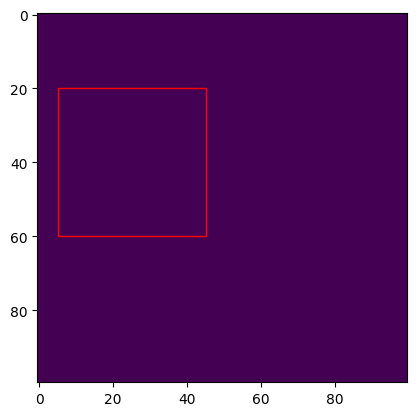

This n candidates 782


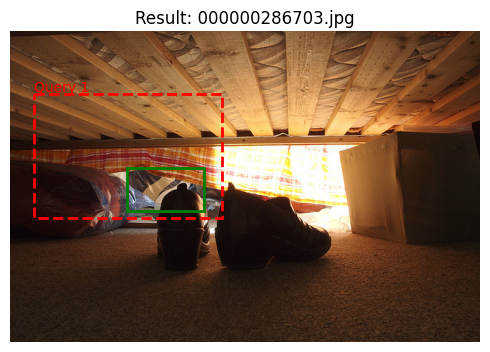

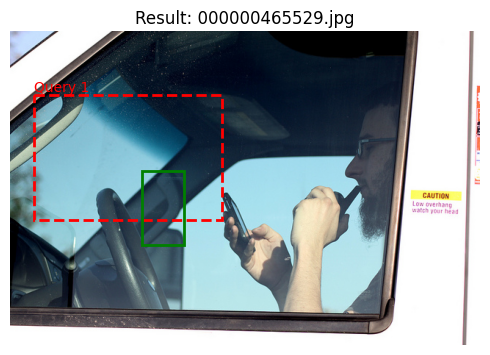

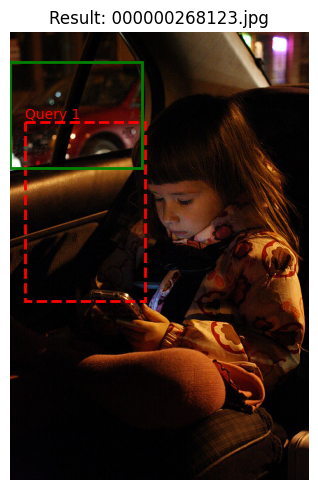

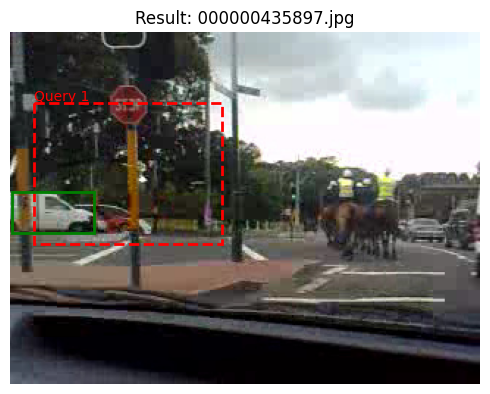

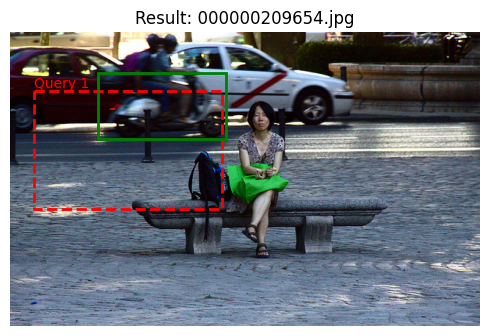

...

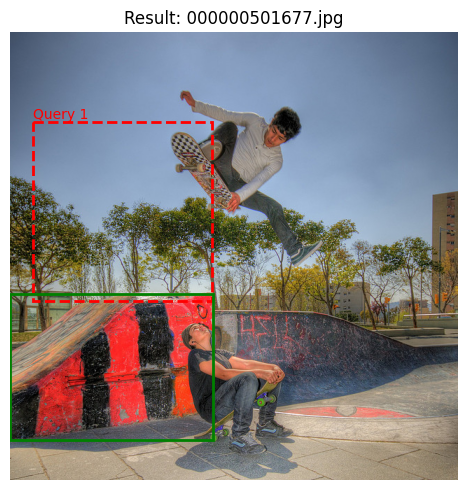

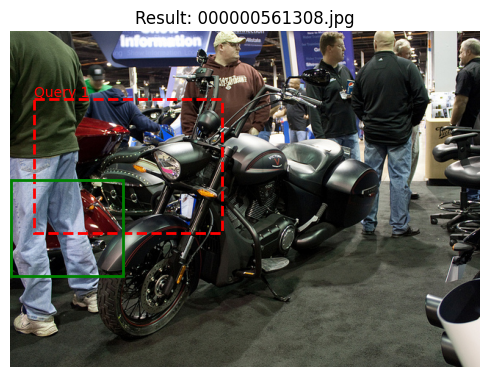

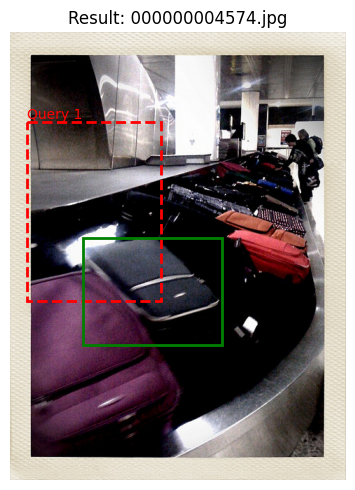

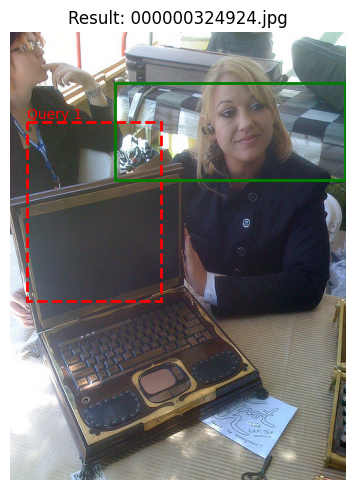

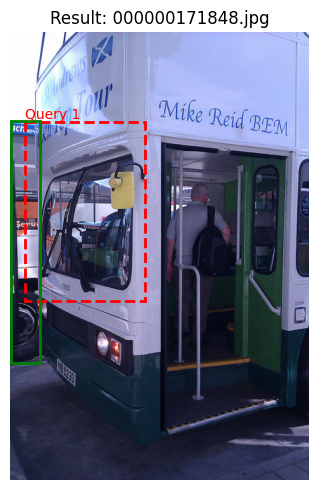

In [17]:
from collections import defaultdict

def euclidean_distance(v1, v2):
    return np.linalg.norm(v1 - v2, ord=2)

def cosine_distance(v1, v2):
    return 1 - np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))


def iou(box1, box2):
    x1, y1, x2, y2 = box1
    x3, y3, x4, y4 = box2
    xA = max(x1, x3)
    yA = max(y1, y3)
    xB = min(x2, x4)
    yB = min(y2, y4)
    
    interArea = max(0, xB - xA) * max(0, yB - yA)
    box1Area = (x2 - x1) * (y2 - y1)
    box2Area = (x4 - x3) * (y4 - y3)
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou

def draw_query_boxes(queries):
    plt.figure()
    plt.imshow(np.zeros((100, 100)))
    for i in range(len(queries)):
        query = queries[i]
        x_min, y_min, x_max, y_max = query
        rect = patches.Rectangle((x_min * 100, y_min * 100), (x_max - x_min) * 100, (y_max - y_min) * 100, linewidth=1, edgecolor='r', facecolor='none')
        plt.gca().add_patch(rect)
    plt.show()


query_boxes = np.array([
    [0.05, 0.2, 0.45, 0.6],
    # [0.5, 0.2, 1, 0.5]
])

draw_query_boxes(query_boxes)

# q1 = q2
# current_query = q1

nprobes = 2
new_features = defaultdict(lambda: [])
for (box, feature_name) in zip(query_boxes, current_query):
    d, cluster_ids = kmeans.index.search(current_query[feature_name].reshape(1,-1), nprobes)
    centroid_offsets = kmeans.centroids[cluster_ids].squeeze()
    for i in range(nprobes):
        feature_residual = current_query[feature_name] - centroid_offsets[i]
        feature_cluster = cluster_ids[0][i]
        new_features[feature_name].append((feature_cluster, feature_residual, box))

# Will store [img][key] = [PQ, PQ, ...]
img_key = defaultdict(lambda: defaultdict(lambda: []))
img_candidates = defaultdict(lambda: set())
for feature_name, feature_list in new_features.items():
    current_imgs = set()
    for (feature_cluster, feature_residual, box) in feature_list:
        tree_search_idxs = trees[feature_cluster].query(box)
        for idx in tree_search_idxs:
            try:
                tree_img = coarse_lists[feature_cluster]['img'][idx]
                tree_codes = coarse_lists[feature_cluster]['codes'][idx]
                tree_boxes = coarse_lists[feature_cluster]['boxes'][idx]
                img_key[tree_img][feature_name].append((tree_codes, tree_boxes, box, feature_residual)) # TODO: Unideal to duplicate the feature_residual
                current_imgs.add(tree_img)
            except Exception as e:
                print('Error processing', tree_img, idx)
                print(e)
                print(len(coarse_lists[feature_cluster]['img']))

    img_candidates[feature_name] = current_imgs


# Get the intersection of all images
common_imgs = set.intersection(*img_candidates.values())
print('This n candidates', len(common_imgs))
img_distances = defaultdict(lambda: 0)
img_counter = defaultdict(lambda: 0)
img_boxes = defaultdict(lambda: defaultdict(str))
alpha = .95
for img in common_imgs:
    for feature_name in new_features.keys():
        min_distance = 1e9
        min_box = (0, 0, 1, 1)
        for (codes, tree_box, box, feature_residual) in img_key[img][feature_name]:
            decoded_residual = pqq.decode(codes.reshape(1, -1))[0].flatten()
            feature_residual = feature_residual.flatten()
            # distance = euclidean_distance(decoded_residual, feature_residual)
            distance = cosine_distance(decoded_residual, feature_residual)
            distance = distance * alpha + (1 - iou(tree_box, box)) * (1 - alpha)
            # print(distance)
            if distance < min_distance:
                min_distance = distance * alpha + (1 - iou(tree_box, box)) * (1 - alpha)
                min_box = tree_box

        img_boxes[img][feature_name] = min_box
        img_distances[img] += min_distance
        img_counter[img] += 1

# Plot top k images
k = 25
top_k_imgs = sorted(img_distances, key=img_distances.get)[:k]
# print(img_distances)



plot_query_results(top_k_imgs, query_boxes, img_dir, img_boxes)




In [18]:
import os
import json
import matplotlib.pyplot as plt
import numpy as np

def read_json_files(directory):
    data = {}
    for filename in os.listdir(directory):
        if filename.endswith('.json'):
            with open(os.path.join(directory, filename), 'r') as f:
                data[filename] = json.load(f)
    return data

def plot_data(data):
    num_files = len(data)
    fig, axes = plt.subplots(num_files, 1, figsize=(12, 6*num_files), squeeze=False)
    fig.tight_layout(pad=5.0)

    for idx, (filename, file_data) in enumerate(data.items()):
        ax = axes[idx, 0]
        segments = []
        our_method_means = []
        our_method_stds = []
        pq_means = []
        pq_stds = []

        for key in file_data.keys():
            if key.startswith('n_segments_') and key.endswith('_counters'):
                segment = int(key.split('_')[2])
                segments.append(segment)
                our_method_means.append(file_data[key]['our_method']['mean'])
                our_method_stds.append(file_data[key]['our_method']['std'])
                pq_means.append(file_data[key]['pq']['mean'])
                pq_stds.append(file_data[key]['pq']['std'])

        x = np.arange(len(segments))
        width = 0.35

        ax.bar(x - width/2, our_method_means, width, label='Our Method', yerr=our_method_stds, capsize=5)
        ax.bar(x + width/2, pq_means, width, label='PQ', yerr=pq_stds, capsize=5)

        ax.set_xlabel('Number of Segments')
        ax.set_ylabel('Counter Mean')
        ax.set_title(f'Comparison of Counters - {filename}')
        ax.set_xticks(x)
        ax.set_xticklabels(segments)
        ax.legend()

        # Add value labels on top of each bar
        for i, v in enumerate(our_method_means):
            ax.text(i - width/2, v + our_method_stds[i], f'{v:.0f}', ha='center', va='bottom')
        for i, v in enumerate(pq_means):
            ax.text(i + width/2, v + pq_stds[i], f'{v:.0f}', ha='center', va='bottom')

    plt.savefig('counter_comparison.png')
    plt.close()

# Usage
directory = '/home/jxu680/concept-compress/runners/sweep_results_traintrain2017_fixed_clip_only_sam_20241007_053444'
data = read_json_files(directory)
plot_data(data)
print("Graph saved as 'counter_comparison.png'")

FileNotFoundError: [Errno 2] No such file or directory: '/home/jxu680/concept-compress/runners/sweep_results_traintrain2017_fixed_clip_only_sam_20241007_053444'

In [1]:
import os
import json
import matplotlib.pyplot as plt
import numpy as np

def read_json_files(directory):
    data = {}
    for filename in os.listdir(directory):
        if filename.endswith('.json'):
            with open(os.path.join(directory, filename), 'r') as f:
                data[filename] = json.load(f)
    return data

def plot_counters(data):
    num_files = len(data)
    fig, axes = plt.subplots(num_files, 1, figsize=(12, 6*num_files), squeeze=False)
    fig.tight_layout(pad=5.0)

    for idx, (filename, file_data) in enumerate(data.items()):
        ax = axes[idx, 0]
        segments = []
        our_method_means = []
        our_method_stds = []
        pq_means = []
        pq_stds = []

        for key in file_data.keys():
            if key.startswith('n_segments_') and key.endswith('_counters'):
                segment = int(key.split('_')[2])
                segments.append(segment)
                our_method_means.append(file_data[key]['our_method']['mean'])
                our_method_stds.append(file_data[key]['our_method']['std'])
                pq_means.append(file_data[key]['pq']['mean'])
                pq_stds.append(file_data[key]['pq']['std'])

        x = np.arange(len(segments))
        width = 0.35

        ax.bar(x - width/2, our_method_means, width, label='Our Method', yerr=our_method_stds, capsize=5)
        ax.bar(x + width/2, pq_means, width, label='PQ', yerr=pq_stds, capsize=5)

        ax.set_xlabel('Number of Segments')
        ax.set_ylabel('Counter Mean')
        ax.set_title(f'Comparison of Counters - {filename}')
        ax.set_xticks(x)
        ax.set_xticklabels(segments)
        ax.legend()

        # Add value labels on top of each bar
        for i, v in enumerate(our_method_means):
            ax.text(i - width/2, v + our_method_stds[i], f'{v:.0f}', ha='center', va='bottom')
        for i, v in enumerate(pq_means):
            ax.text(i + width/2, v + pq_stds[i], f'{v:.0f}', ha='center', va='bottom')

    plt.savefig('counter_comparison.png')
    plt.close()

def plot_average_precision(data):
    num_files = len(data)
    fig, axes = plt.subplots(num_files, 1, figsize=(12, 6*num_files), squeeze=False)
    fig.tight_layout(pad=5.0)

    for idx, (filename, file_data) in enumerate(data.items()):
        ax = axes[idx, 0]
        segments = []
        our_method_ap_means = []
        our_method_ap_stds = []
        pq_ap_means = []
        pq_ap_stds = []

        for key in file_data.keys():
            if key.startswith('n_segments_') and not key.endswith('_counters'):
                segment = int(key.split('_')[2])
                segments.append(segment)
                our_method_ap_means.append(file_data[key]['our_method_ap']['mean'])
                our_method_ap_stds.append(file_data[key]['our_method_ap']['std'])
                pq_ap_means.append(file_data[key]['pq_ap']['mean'])
                pq_ap_stds.append(file_data[key]['pq_ap']['std'])

        x = np.arange(len(segments))
        width = 0.35

        ax.bar(x - width/2, our_method_ap_means, width, label='Our Method AP', yerr=our_method_ap_stds, capsize=5)
        ax.bar(x + width/2, pq_ap_means, width, label='PQ AP', yerr=pq_ap_stds, capsize=5)

        ax.set_xlabel('Number of Segments')
        ax.set_ylabel('Average Precision')
        ax.set_title(f'Comparison of Average Precision - {filename}')
        ax.set_xticks(x)
        ax.set_xticklabels(segments)
        ax.legend()

        # Add value labels on top of each bar
        for i, v in enumerate(our_method_ap_means):
            ax.text(i - width/2, v + our_method_ap_stds[i], f'{v:.4f}', ha='center', va='bottom')
        for i, v in enumerate(pq_ap_means):
            ax.text(i + width/2, v + pq_ap_stds[i], f'{v:.4f}', ha='center', va='bottom')

    plt.savefig('average_precision_comparison.png')
    plt.close()

# Usage
# directory = 'path/to/your/json/files'
directory = '/home/jxu680/image-concept-compression/sweep_results_train2017_fixed_maskclip_mobilesam_20241009_055019'
data = read_json_files(directory)
plot_counters(data)
plot_average_precision(data)
print("Graphs saved as 'counter_comparison.png' and 'average_precision_comparison.png'")

Graphs saved as 'counter_comparison.png' and 'average_precision_comparison.png'
